<a href="https://colab.research.google.com/github/IvanWilliam13/SentimentAnalysis_UsingGranite/blob/main/DataSummarizing%26Classifying_Granite.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install langchain_community
!pip install replicate
from langchain_community.llms import Replicate
import os
from google.colab import userdata
import pandas as pd
import numpy as np
import random
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', None)

In [ ]:
#Buat API Token
api_token = userdata.get('api_token')
os.environ["REPLICATE_API_TOKEN"] = api_token
# Model setup
model = "ibm-granite/granite-3.3-8b-instruct"
output = Replicate(model=model,replicate_api_token=api_token,)

# Impute Text Data

In [ ]:
df = pd.read_csv('netflix_reviews.csv')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136850 entries, 0 to 136849
Data columns (total 8 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   reviewId              136850 non-null  object
 1   userName              136848 non-null  object
 2   content               136844 non-null  object
 3   score                 136850 non-null  int64 
 4   thumbsUpCount         136850 non-null  int64 
 5   reviewCreatedVersion  113725 non-null  object
 6   at                    136850 non-null  object
 7   appVersion            113725 non-null  object
dtypes: int64(2), object(6)
memory usage: 8.4+ MB


In [ ]:
#Hapus Review Yang Spam
spam = df[df.duplicated(subset=['content','userName','at','reviewId'], keep=False)].sort_values(by='content')
df.drop(index=spam.index, inplace=True)

In [ ]:
#Hapus yang NaN
df=df.dropna()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 113324 entries, 0 to 136848
Data columns (total 8 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   reviewId              113324 non-null  object
 1   userName              113324 non-null  object
 2   content               113324 non-null  object
 3   score                 113324 non-null  int64 
 4   thumbsUpCount         113324 non-null  int64 
 5   reviewCreatedVersion  113324 non-null  object
 6   at                    113324 non-null  object
 7   appVersion            113324 non-null  object
dtypes: int64(2), object(6)
memory usage: 7.8+ MB


In [ ]:
#Mengambil Semua Reviews dari Kolom content
reviews=df['content'].tolist()
print(reviews)

['the app is freezing. pls help', "I can't login rn fix it", 'I love it so much and i even wanna enjoy watching movies', 'awsome experience', "this is kinda cool but I haven't seen the new miraculous ladybug yet and there's no update yet in Netflix", 'All Good movies not found on Netflix waste of money never gonna buy it again', 'dimak kharab not working properly login area', 'tried uninstalling and reinstalling nothing is playing on my phone. tried downloading but same error.', 'Subscription price increased to $29.98. But yet content is very limited. Where are all the episodes of WWE Raw and Smackdown from previous years? Way too slow to upload them. What are we paying you for?', 'nice', "Seriously 'Kaala Paani Season 2' got canceled!!! Instead of showcasing scraps in your platform, provide this masterpiece. Worst decision ever!", 'so poor', 'What happened to my app _ from the last two days not opening and some error codes were shown.', 'why so much of troubleshoot issue????', 'give b

# Data Classification

In [ ]:
#Mengambil 25 review secara acak, karena jika lebih, tidak akan bisa di print
sampel_review = random.sample(reviews, 25)

#Membuat teks prompt
reviews_text = "\n".join([f"Review {i+1}: {review}" for i, review in enumerate(sampel_review)])

#Membuat prompt klasifikasi
prompt = f"""You are a smart sentiment analysis expert.

Analyze the following 25 app reviews. For each review, classify:
- Sentiment: Positive, Negative, or Mixed
- Categories: Choose 1 or more from these: Content, Performance, UX/UI, Features, Pricing, Bugs, Other

Format your answer like this:
Review X:
- [Positive, Negative, or Mixed] - Categories: [comma-separated list from above]

Now analyze the reviews:

{reviews_text}
"""

#Parameter konfigurasi
parameters = {
    "top_k": 0,
    "top_p": 0.9,
    "max_tokens": 512,
    "min_tokens": 50,
    "random_seed": 42,
    "repetition_penalty": 1.1,
    "stopping_criteria": "length (512 tokens)",
    "stopping_sequence": None
}

# Invoke model dengan prompt dan parameter
answer = output.invoke(prompt, **parameters)

# Tampilkan review sampel
print("Review Sampel:\n")
numbering=1
for x in sampel_review:
  print(numbering,x)
  numbering+=1

print('------------------------------------------------------------------------')

# Tampilkan respons model
print("\nGranite Model Response:\n")
print(answer)


Review Sampel:

1 it has all the movies that I like personality and the tv shows to like come on its Netflix for God sake I would give it six stars if I could but It only goes up to five so ole well
2 Pure greatness
3 I love Netflix. But I want the same LIVE NETFLIX SCREEN when I open the app that I get in iOS. Please make this happen. Its discrimination. 😭😭😭
4 Costs way too much $$$ for the content, takes forever to download
5 It has the most high quality movies that my phone almost exploded
6 I'm enjoying my Netflix every day great movies and shows
7 I really love Netflix, good quality video streaming and had an amazing viewing experience across all platforms. But affording 800 bucks monthly is too expensive. I used it for 6 months till now and had to cancel due to high cost. Whereas amazon prime is offering for 120 bucks per month with all options including 4k . Overall I am highly disappointed with Netflix only on costing part.
8 Last update issue - since last update Chromecast sup

# Data Summarizing

In [ ]:
#Parameters
parameters = {
"top_k": 3,
"top_p": 1.0,
"max_tokens": 512,
"min_tokens": 0,
"random_seed": 42,
"repetition_penalty": 1.1,
"stopping_criteria": "length (256 tokens)",
"stopping_sequence": None
}
#Turn list into a paragraph
review_paragraph = " ".join(sampel_review)

#Prompt analisis review
prompt = f"""
You are a sentiment analysis expert.

Below is a collection of user reviews for a streaming app:

{review_paragraph}

Please analyze and summarize:
1. What is the overall sentiment of the users? Choose: Positive, Negative, or Mixed. Explain your reasoning.
2. What are the most common categories of complaints? Choose from: Performance, Bugs, UX/UI, Features, Pricing, Content, or Other.
3. What features or aspects are most appreciated by users?

Present your answer clearly, answer each question in paragraph
"""
#Invoke Model
response = output.invoke(review_paragraph,parameters=parameters)

print("Granite Model Response for refined focus area response:\n")
print(response)

Granite Model Response for refined focus area response:

The user expresses a complex relationship with Netflix, highlighting both praise and criticism:

**Positive Aspects:**
- Extensive library of movies and TV shows, including favorites and high-quality content.
- Enjoyable viewing experience across platforms, with great video quality.
- Support for Dave Chappelle and resistance to cancel culture, which the user appreciates.
- Convenience for watching on-the-go without Wi-Fi.
- Ability to rewatch older episodes of shows like NCIS and Grey's Anatomy.

**Criticisms and Issues:**
- High cost, leading to cancellation despite appreciation for content.
- Slow download times and expensive monthly fees compared to competitors like Amazon Prime.
- Technical issues post-app update, specifically broken Chromecast support on Android, rendering it useless for streaming to larger TVs.
- Difficulties signing in and managing account due to persistent bugs and sign-out issues.
- Notification overloa

# Data Visualization

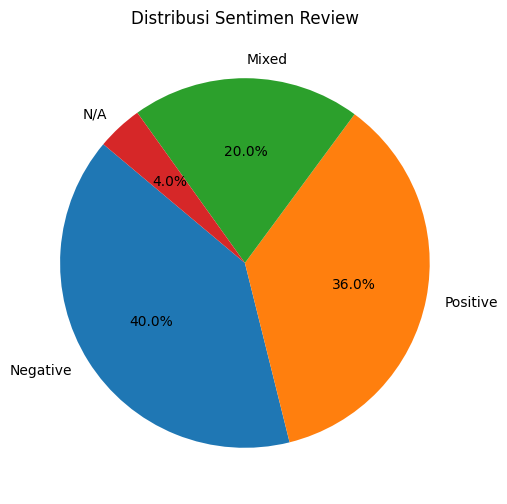

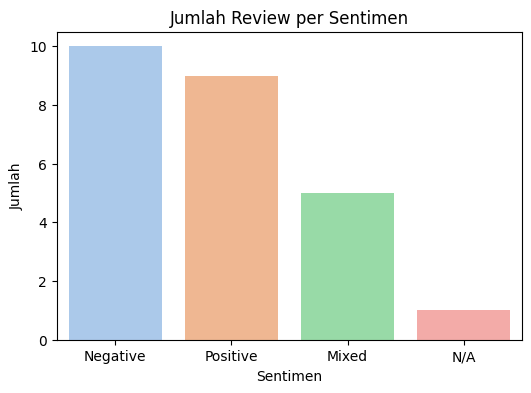

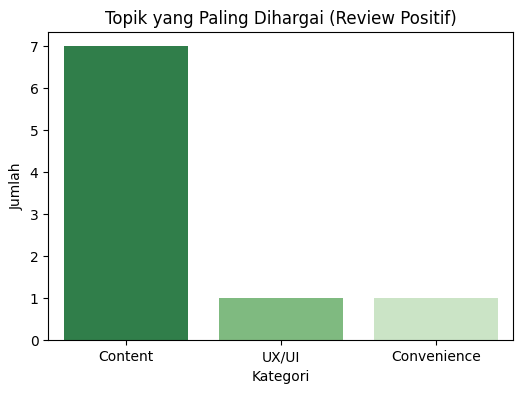

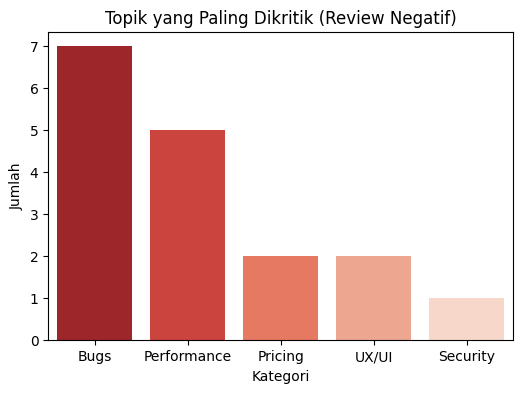

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from collections import Counter

# 1. Data input sesuai Granite Model Response
data = [
    {"sentiment": "Positive", "categories": ["Content"]},
    {"sentiment": "Positive", "categories": []},
    {"sentiment": "Mixed", "categories": ["UX/UI"]},
    {"sentiment": "Negative", "categories": ["Pricing", "Performance"]},
    {"sentiment": "Positive", "categories": ["Content"]},
    {"sentiment": "Positive", "categories": ["Content"]},
    {"sentiment": "Mixed", "categories": ["Pricing", "Content"]},
    {"sentiment": "Negative", "categories": ["Performance", "Bugs"]},
    {"sentiment": "Negative", "categories": ["Performance", "Bugs"]},
    {"sentiment": "Negative", "categories": ["UX/UI", "Bugs"]},
    {"sentiment": "Mixed", "categories": ["Content", "Bugs"]},
    {"sentiment": "Negative", "categories": []},
    {"sentiment": "Positive", "categories": ["Content"]},
    {"sentiment": "Positive", "categories": ["Content"]},
    {"sentiment": "Mixed", "categories": ["Content"]},
    {"sentiment": "Negative", "categories": ["Performance", "Bugs"]},
    {"sentiment": "Negative", "categories": ["Pricing"]},
    {"sentiment": "Negative", "categories": ["Bugs", "Security"]},
    {"sentiment": "Mixed", "categories": ["UX/UI"]},
    {"sentiment": "Negative", "categories": ["UX/UI", "Bugs"]},
    {"sentiment": "Negative", "categories": ["Performance", "Bugs"]},
    {"sentiment": "N/A", "categories": []},
    {"sentiment": "Positive", "categories": ["Content"]},
    {"sentiment": "Positive", "categories": ["Content"]},
    {"sentiment": "Positive", "categories": ["UX/UI", "Convenience"]}
]

df = pd.DataFrame(data)

#Pie chart & bar chart untuk distribusi sentimen
sentiment_counts = df['sentiment'].value_counts()

# Pie chart
plt.figure(figsize=(6, 6))
plt.pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%', startangle=140)
plt.title("Distribusi Sentimen Review")
plt.show()

# Bar chart
plt.figure(figsize=(6, 4))
sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette="pastel")
plt.title("Jumlah Review per Sentimen")
plt.ylabel("Jumlah")
plt.xlabel("Sentimen")
plt.show()

#Menghitung frekuensi kategori dari sentimen tertentu
def get_category_frequencies(sentiment):
    filtered = df[df['sentiment'] == sentiment]
    categories = [cat for sublist in filtered['categories'] for cat in sublist]
    return Counter(categories)

#Visualisasi kategori terbanyak untuk Positive
pos_freq = get_category_frequencies("Positive")
pos_df = pd.DataFrame(pos_freq.items(), columns=["Category", "Count"]).sort_values(by="Count", ascending=False)

plt.figure(figsize=(6, 4))
sns.barplot(data=pos_df, x="Category", y="Count", palette="Greens_r")
plt.title("Topik yang Paling Dihargai (Review Positif)")
plt.ylabel("Jumlah")
plt.xlabel("Kategori")
plt.show()

#Visualisasi kategori terbanyak untuk Negative
neg_freq = get_category_frequencies("Negative")
neg_df = pd.DataFrame(neg_freq.items(), columns=["Category", "Count"]).sort_values(by="Count", ascending=False)

plt.figure(figsize=(6, 4))
sns.barplot(data=neg_df, x="Category", y="Count", palette="Reds_r")
plt.title("Topik yang Paling Dikritik (Review Negatif)")
plt.ylabel("Jumlah")
plt.xlabel("Kategori")
plt.show()
